In [1]:
# Hvor meget strøm er der blevet brugt af alle nodes
# Hvor meget strøm der er genereret af PV
# Hvor strøm der er hentet fra grid


# Kommer batterier nogensinde til 100% - Svar: JA
# Exporter vi nogensinde strøm til grid - Svar: NEJ

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, FuncFormatter
import seaborn as sns
import os
import re
from collections import defaultdict


#PATH_PLUGIN = '../results/plugin/25may-5xspeed-withplugin/logs/'
PATH_PLUGIN = '../results/plugin/10jun-30xspeed-withplugin-020pods/logs/'
#PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/26may-5xspeed-withoutplugin/logs/'
PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/10jun-30xspeed-withoutplugin-020pods/logs/'

CARBON_PATH = '../data/carbon-averages.csv'

battery_cols = ['battery', 'battery.1', 'battery.2', 'battery.3', 'battery.4']
node_cols = ['node', 'node.1', 'node.2', 'node.3', 'node.4', 'node.5', 'node.6', 'node.7', 'node.8', 'node.9', 'node.10', 'node.11', 'node.12', 'node.13', 'node.14', 'node.15', 'node.16', 'node.17']
pv_cols = ['pv_source', 'pv_source.1', 'pv_source.2', 'pv_source.3']
grid_cols = ['grid', 'grid.1', 'grid.2', 'grid.3', 'grid.4', 'grid.5', 'grid.6', 'grid.7']
balancing_cols = ['balancing', 'balancing.1', 'balancing.2']
balance_cols = ['balance', 'balance.1', 'balance.2', 'balance.3', 'balance.4', 'balance.5', 'balance.6', 'balance.7', 'balance.8', 'balance.9']


## Generate a dict for each microgrid

In [3]:
gridnames = pd.read_csv('../data/gridnames.csv')
names = gridnames['Gridname'].to_list()

test_df = pd.read_csv('../logs/XK00.csv')

#NUM_ROWS = 2016+3
NUM_ROWS = 1907  # TEMP NUMBER
key_to_skip = "DE02"

dataframes_plugin = {}
dataframes_default_scheduler = {}

# Load Plugin DataFrames and truncate, skipping DE02
for name in names:
    if name == key_to_skip:
        print(f"Skipping {name} in Plugin data loading.")
        continue

    file_path = os.path.join(PATH_PLUGIN, f"{name}.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        dataframes_plugin[name] = df.iloc[:NUM_ROWS]
    else:
        print(f"Warning: File {file_path} does not exist.")

# Load Scheduler DataFrames, skipping DE02
for name in names:
    if name == key_to_skip:
        print(f"Skipping {name} in Scheduler data loading.")
        continue

    file_path = os.path.join(PATH_DEFAULT_SCHEDULER, f"{name}.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        dataframes_default_scheduler[name] = df.iloc[:NUM_ROWS]  # <-- truncate to same row count
    else:
        print(f"Warning: File {file_path} does not exist.")


Skipping DE02 in Plugin data loading.
Skipping DE02 in Scheduler data loading.


In [4]:
plugin_row_counts = {name: len(df) for name, df in dataframes_plugin.items()}
scheduler_row_counts = {name: len(df) for name, df in dataframes_default_scheduler.items()}

comparison_df = pd.DataFrame({
    'Name': names,
    'Plugin': [plugin_row_counts.get(name) for name in names],
    'Scheduler': [scheduler_row_counts.get(name) for name in names]
})

comparison_df['Equal'] = comparison_df['Plugin'] == comparison_df['Scheduler']

print(comparison_df)
not_equal_rows = comparison_df[~comparison_df['Equal']]
print("\nRows where Plugin and Scheduler do NOT have equal rows:")
print(not_equal_rows)

     Name  Plugin  Scheduler  Equal
0    AL00  1907.0     1907.0   True
1    AT01  1907.0     1907.0   True
2    AT02  1907.0     1907.0   True
3    AT03  1907.0     1907.0   True
4    BA00  1907.0     1907.0   True
..    ...     ...        ...    ...
147  UK03  1907.0     1907.0   True
148  UK04  1907.0     1907.0   True
149  UK05  1907.0     1907.0   True
150  UKNI  1907.0     1907.0   True
151  XK00  1907.0     1907.0   True

[152 rows x 4 columns]

Rows where Plugin and Scheduler do NOT have equal rows:
    Name  Plugin  Scheduler  Equal
15  DE02     NaN        NaN  False


## Battery Dataframes

In [5]:
battery_dataframes_plugin = {}
battery_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_scheduler[name] = df[existing_cols]


### Rename headers

In [6]:
for key, df in battery_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_plugin[key] = df

for key, df in battery_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_scheduler[key] = df


battery_dataframes_plugin['AL00']


1,charge_amount,current_charge,discharge_amount,reward,soc
0,0.0,11648.35,720.0,-0.0,0.500000
1,0.0,10848.35,720.0,-0.0,0.465660
2,0.0,10048.35,720.0,-0.0,0.431321
3,0.0,9248.35,720.0,-0.0,0.396981
4,0.0,8448.35,720.0,-0.0,0.362641
...,...,...,...,...,...
1900,0.0,0.00,0.0,-0.0,0.000000
1901,0.0,0.00,0.0,-0.0,0.000000
1902,0.0,0.00,0.0,-0.0,0.000000
1903,0.0,0.00,0.0,-0.0,0.000000


### Plot figures (SOC)

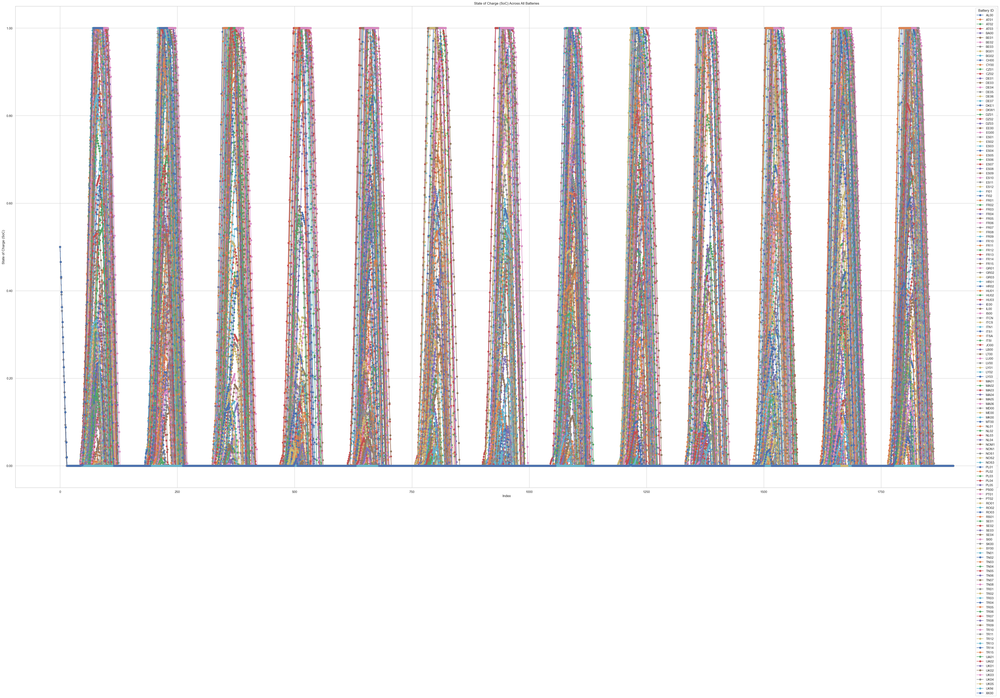

In [7]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in battery_dataframes_plugin.items():
    if 'soc' not in df.columns:
        print(f"Skipping {key}: no 'soc' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['soc'] = pd.to_numeric(df['soc'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['soc'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("State of Charge (SoC) Across All Batteries")
plt.xlabel("Index")
plt.ylabel("State of Charge (SoC)")
plt.grid(True)
plt.legend(title="Battery ID")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Grid Dataframes

In [8]:
grid_dataframes_plugin = {}
grid_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_scheduler[name] = df[existing_cols]

### Rename headers

In [9]:
for key, df in grid_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_plugin[key] = df

for key, df in grid_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_scheduler[key] = df


#grid_dataframes_plugin['AL00']
grid_dataframes_plugin['ES10']

1,co2_per_kwh_current,co2_production,export_price_current,grid_export,grid_import,grid_status_current,import_price_current,reward
0,0.088305,0.000000,799.2,0.0,0.0,1.0,888.0,-0.0
1,0.088305,0.000000,799.2,0.0,0.0,1.0,888.0,-0.0
2,0.088305,0.000000,799.2,0.0,0.0,1.0,888.0,-0.0
3,0.088305,0.000000,799.2,0.0,0.0,1.0,888.0,-0.0
4,0.088305,0.000000,799.2,0.0,0.0,1.0,888.0,-0.0
...,...,...,...,...,...,...,...,...
1900,0.088305,63.402839,799.2,0.0,718.0,1.0,888.0,-637584.0
1901,0.088305,63.402839,799.2,0.0,718.0,1.0,888.0,-637584.0
1902,0.088305,63.402839,799.2,0.0,718.0,1.0,888.0,-637584.0
1903,0.088305,63.402839,799.2,0.0,718.0,1.0,888.0,-637584.0


### Plugin

#### Plot Plugin figures (Export, Import, CO2 Production)

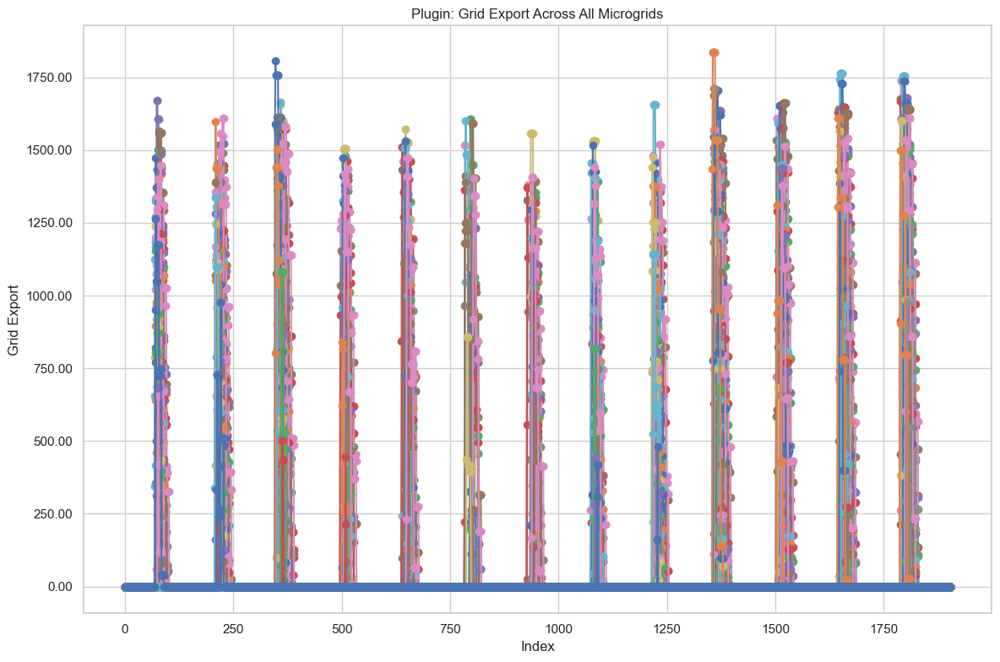

In [10]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Plugin: Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

In [11]:
total_exports = {}

for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Ensure the column is numeric
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Calculate total export and store it
    total_export = df['grid_export'].sum(skipna=True)
    total_exports[key] = total_export

# Print total exports
print("\nPlugin: Total Grid Export per Microgrid:")
for key, total in total_exports.items():
    print(f"{key}: {total:.2f}")


Plugin: Total Grid Export per Microgrid:
AL00: 4638.12
AT01: 0.00
AT02: 0.00
AT03: 0.00
BA00: 2605.24
BE01: 0.00
BE02: 0.00
BE03: 0.00
BG01: 42633.55
BG02: 28427.63
CH00: 0.00
CY00: 22837.46
CZ01: 0.00
CZ02: 0.00
DE01: 0.00
DE03: 0.00
DE04: 0.00
DE05: 0.00
DE06: 0.00
DE07: 0.00
DKE1: 0.00
DKW1: 0.00
DZ01: 227846.63
DZ02: 192958.97
DZ03: 242066.58
EE00: 0.00
EG00: 252844.63
ES01: 0.00
ES02: 0.00
ES03: 0.00
ES04: 23616.37
ES05: 22620.89
ES06: 38330.62
ES07: 10818.11
ES08: 9465.18
ES09: 8996.85
ES10: 28108.15
ES11: 10810.27
ES12: 1981.77
FI01: 0.00
FI02: 0.00
FR01: 0.00
FR02: 0.00
FR03: 14527.80
FR04: 0.00
FR05: 0.00
FR06: 4970.70
FR07: 0.00
FR08: 0.00
FR09: 0.00
FR10: 0.00
FR11: 0.00
FR12: 0.00
FR13: 0.00
FR14: 0.00
FR15: 0.00
GR01: 25568.73
GR02: 0.00
GR03: 0.00
HR01: 0.00
HR02: 0.00
HU01: 0.00
HU02: 0.00
HU03: 0.00
IE00: 0.00
IL00: 156273.15
IS00: 0.00
ITCN: 4458.54
ITCS: 0.00
ITN1: 19594.46
ITS1: 11911.90
ITSA: 13743.75
ITSI: 21403.33
JO00: 160354.68
LB00: 35091.78
LT00: 0.00
LU00: 0

In [12]:
# Calculate total export across all microgrids
total_export_all = sum(total_exports.values())

print(f"\nPlugin: Total Grid Export Across ALL Microgrids: {total_export_all:.2f}")


Plugin: Total Grid Export Across ALL Microgrids: 5671672.96


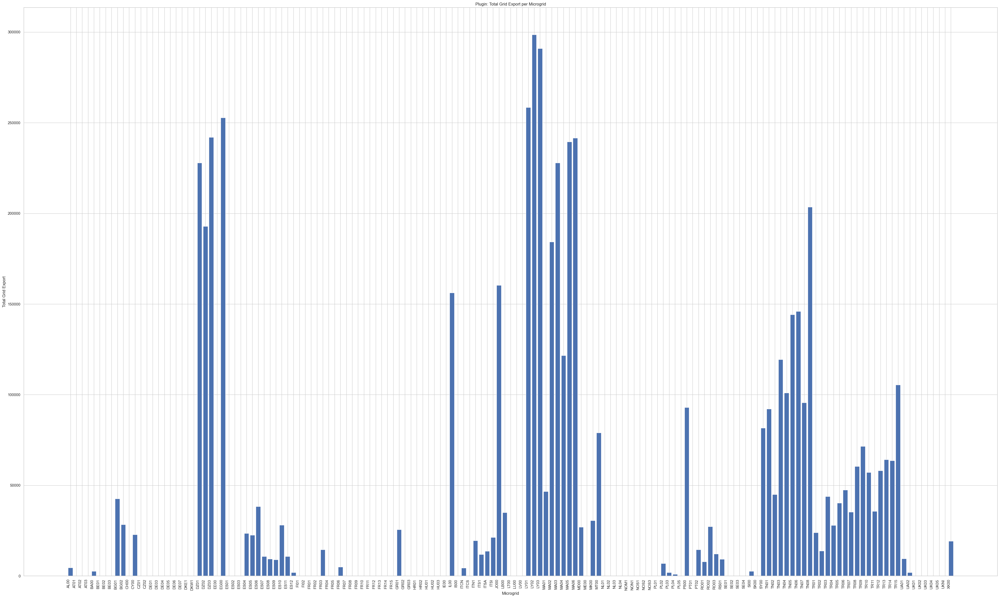

In [13]:
plt.figure(figsize=(40, 24))
plt.bar(total_exports.keys(), total_exports.values())
plt.title("Plugin: Total Grid Export per Microgrid")
plt.xlabel("Microgrid")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align them
plt.xticks(rotation=90, ha='right')  # or rotation=90 if needed

plt.tight_layout()
plt.show()


Plugin: Total Grid Export by Country Code:
MA: 1061682.84
TN: 947080.31
LY: 847975.95
TR: 749288.52
DZ: 662872.18
EG: 252844.63
JO: 160354.68
IL: 156273.15
ES: 154748.21
PS: 93040.52
SY: 81595.32
MT: 79087.39
IT: 71111.98
BG: 71061.18
RO: 47438.94
LB: 35091.78
MK: 30627.96
MD: 27032.40
GR: 25568.73
CY: 22837.46
FR: 19498.50
XK: 19245.93
PT: 14553.27
UA: 11648.89
PL: 9905.92
RS: 9316.77
AL: 4638.12
SI: 2646.17
BA: 2605.24
AT: 0.00
BE: 0.00
CH: 0.00
CZ: 0.00
DE: 0.00
DK: 0.00
EE: 0.00
FI: 0.00
HR: 0.00
HU: 0.00
IE: 0.00
IS: 0.00
LT: 0.00
LU: 0.00
LV: 0.00
ME: 0.00
NL: 0.00
NO: 0.00
SE: 0.00
SK: 0.00
UK: 0.00


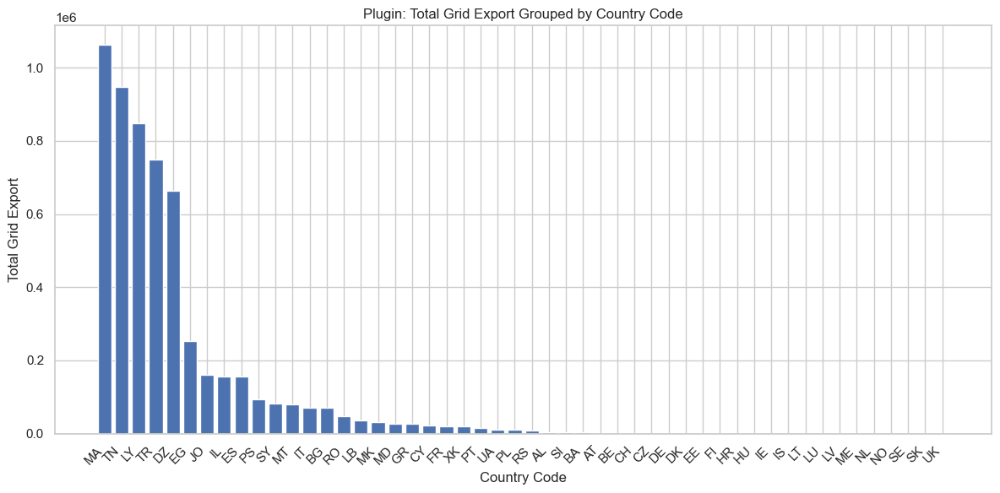

In [14]:

# --- Step 1: Total exports per grid ---
total_exports = {}

for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        continue

    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')
    total_exports[key] = df['grid_export'].sum(skipna=True)

# --- Step 2: Extract 2-letter country code prefix (e.g., AL, ES) ---
def extract_code(key):
    match = re.match(r'^([A-Za-z]{2})', key)  # now accepts lowercase too
    return match.group(1).upper() if match else 'Unknown'

# --- Step 3: Group by extracted country code ---
code_grouped_exports = defaultdict(float)
for key, total in total_exports.items():
    code = extract_code(key)
    code_grouped_exports[code] += total

# --- Step 4: Sort and print grouped totals ---
sorted_codes = dict(sorted(code_grouped_exports.items(), key=lambda item: item[1], reverse=True))

print("\nPlugin: Total Grid Export by Country Code:")
for code, total in sorted_codes.items():
    print(f"{code}: {total:.2f}")

plt.figure(figsize=(12, 6))  # Wider plot for more spacing
plt.bar(sorted_codes.keys(), sorted_codes.values())
plt.title("Plugin: Total Grid Export Grouped by Country Code")
plt.xlabel("Country Code")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

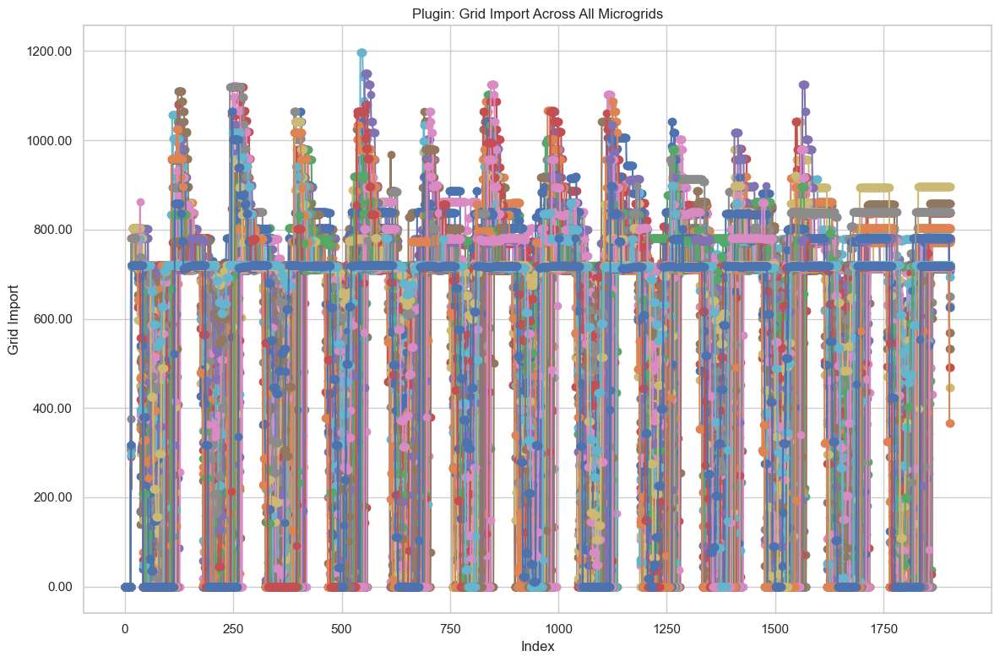

In [15]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_import' not in df.columns:
        print(f"Skipping {key}: no 'grid_import' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_import'] = pd.to_numeric(df['grid_import'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_import'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Plugin: Grid Import Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Import")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

### Scheduler

#### Plot Scheduler figures (Export, Import, CO2 Production)

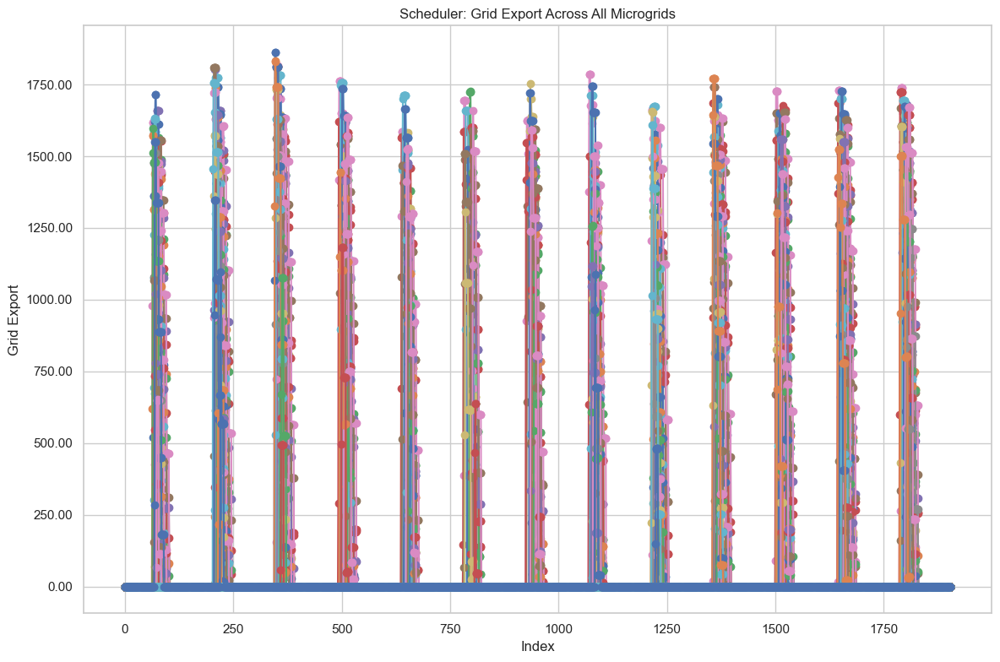

In [16]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Scheduler: Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

In [17]:
total_exports = {}

for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Ensure the column is numeric
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Calculate total export and store it
    total_export = df['grid_export'].sum(skipna=True)
    total_exports[key] = total_export

# Print total exports
print("\nScheduler: Total Grid Export per Microgrid:")
for key, total in total_exports.items():
    print(f"{key}: {total:.2f}")


Scheduler: Total Grid Export per Microgrid:
AL00: 4595.09
AT01: 5124.00
AT02: 538.36
AT03: 2106.65
BA00: 1195.02
BE01: 0.00
BE02: 0.00
BE03: 0.00
BG01: 63241.95
BG02: 67654.52
CH00: 0.00
CY00: 43488.46
CZ01: 0.00
CZ02: 0.00
DE01: 0.00
DE03: 0.00
DE04: 0.00
DE05: 0.00
DE06: 0.00
DE07: 0.00
DKE1: 0.00
DKW1: 0.00
DZ01: 244768.60
DZ02: 250807.42
DZ03: 294052.58
EE00: 0.00
EG00: 370600.49
ES01: 0.00
ES02: 0.00
ES03: 3564.50
ES04: 27426.37
ES05: 43489.67
ES06: 45156.96
ES07: 13506.11
ES08: 9409.18
ES09: 16939.28
ES10: 31921.09
ES11: 7585.46
ES12: 1845.77
FI01: 0.00
FI02: 0.00
FR01: 0.00
FR02: 0.00
FR03: 18775.45
FR04: 0.00
FR05: 0.00
FR06: 5058.70
FR07: 0.00
FR08: 0.00
FR09: 0.00
FR10: 0.00
FR11: 0.00
FR12: 0.00
FR13: 0.00
FR14: 0.00
FR15: 0.00
GR01: 41874.86
GR02: 7701.47
GR03: 8323.72
HR01: 0.00
HR02: 0.00
HU01: 0.00
HU02: 5519.45
HU03: 0.00
IE00: 0.00
IL00: 186288.95
IS00: 0.00
ITCN: 2240.54
ITCS: 603.06
ITN1: 19432.46
ITS1: 11824.49
ITSA: 11584.76
ITSI: 21751.33
JO00: 239335.49
LB00: 41

In [18]:
# Calculate total export across all microgrids
total_export_all = sum(total_exports.values())

print(f"\nScheduler: Total Grid Export Across ALL Microgrids: {total_export_all:.2f}")


Scheduler: Total Grid Export Across ALL Microgrids: 7348133.49


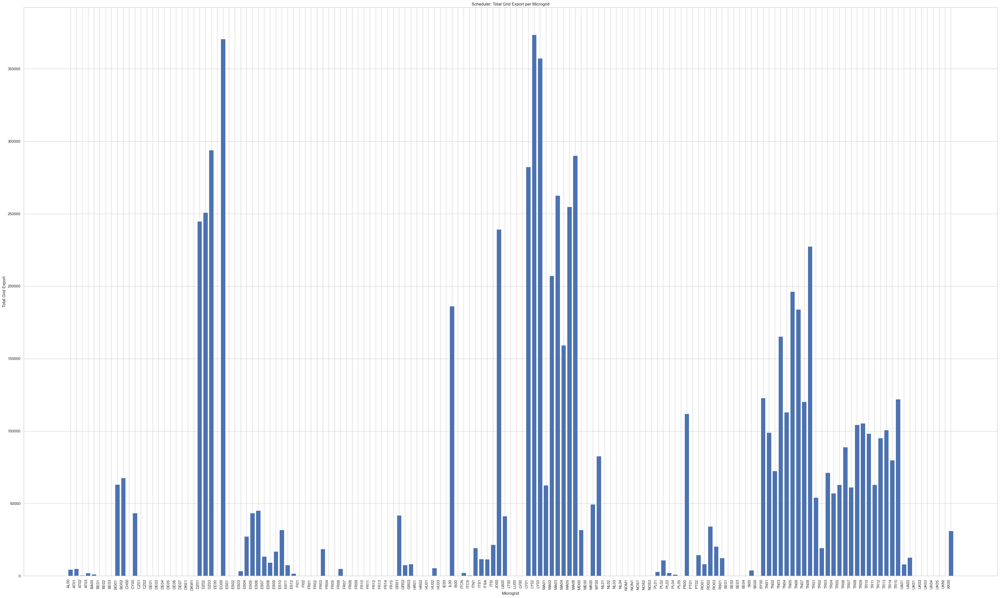

In [19]:
plt.figure(figsize=(40, 24))
plt.bar(total_exports.keys(), total_exports.values())
plt.title("Scheduler: Total Grid Export per Microgrid")
plt.xlabel("Microgrid")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align them
plt.xticks(rotation=90, ha='right')  # or rotation=90 if needed

plt.tight_layout()
plt.show()


Scheduler: Total Grid Export by Country Code:
MA: 1237025.46
TR: 1185500.30
TN: 1178321.49
LY: 1013397.53
DZ: 789628.60
EG: 370600.49
JO: 239335.49
ES: 200844.39
IL: 186288.95
BG: 130896.47
SY: 122989.76
PS: 111959.60
MT: 82853.38
IT: 67436.65
RO: 63272.08
GR: 57900.06
MK: 49637.00
CY: 43488.46
LB: 41351.48
MD: 31900.35
XK: 31202.96
FR: 23834.15
UA: 21054.97
PL: 17161.45
PT: 14637.27
RS: 12564.77
AT: 7769.01
HU: 5519.45
AL: 4595.09
SI: 3971.32
BA: 1195.02
BE: 0.00
CH: 0.00
CZ: 0.00
DE: 0.00
DK: 0.00
EE: 0.00
FI: 0.00
HR: 0.00
IE: 0.00
IS: 0.00
LT: 0.00
LU: 0.00
LV: 0.00
ME: 0.00
NL: 0.00
NO: 0.00
SE: 0.00
SK: 0.00
UK: 0.00


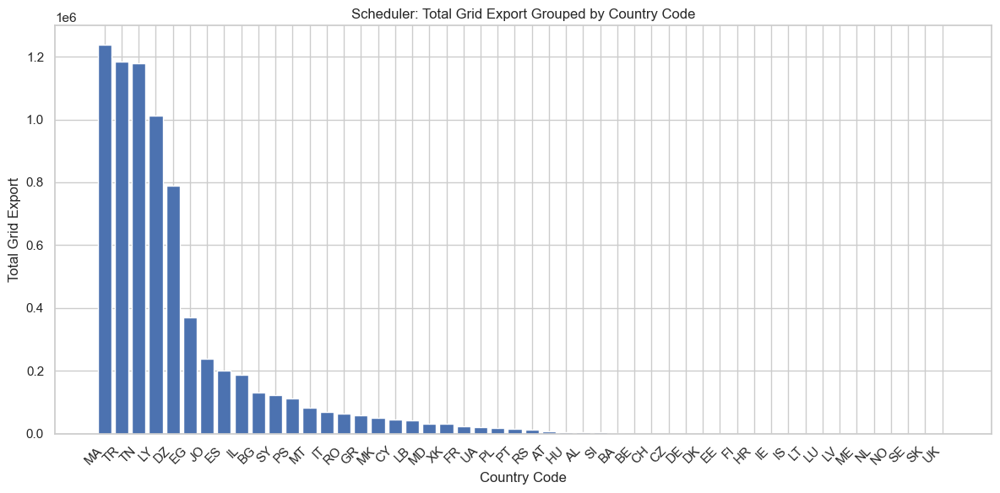

In [20]:

# --- Step 1: Total exports per grid ---
total_exports = {}

for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        continue

    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')
    total_exports[key] = df['grid_export'].sum(skipna=True)

# --- Step 2: Extract 2-letter country code prefix (e.g., AL, ES) ---
def extract_code(key):
    match = re.match(r'^([A-Za-z]{2})', key)  # now accepts lowercase too
    return match.group(1).upper() if match else 'Unknown'

# --- Step 3: Group by extracted country code ---
code_grouped_exports = defaultdict(float)
for key, total in total_exports.items():
    code = extract_code(key)
    code_grouped_exports[code] += total

# --- Step 4: Sort and print grouped totals ---
sorted_codes = dict(sorted(code_grouped_exports.items(), key=lambda item: item[1], reverse=True))

print("\nScheduler: Total Grid Export by Country Code:")
for code, total in sorted_codes.items():
    print(f"{code}: {total:.2f}")

plt.figure(figsize=(12, 6))  # Wider plot for more spacing
plt.bar(sorted_codes.keys(), sorted_codes.values())
plt.title("Scheduler: Total Grid Export Grouped by Country Code")
plt.xlabel("Country Code")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

## PV Dataframes

In [21]:
pv_dataframes_plugin = {}
pv_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_scheduler[name] = df[existing_cols]

In [22]:
for key, df in pv_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_plugin[key] = df

for key, df in pv_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_scheduler[key] = df


pv_dataframes_scheduler['AL00']

1,curtailment,renewable_current,renewable_used,reward
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
1900,0.0,0.0,0.0,0.0
1901,0.0,0.0,0.0,0.0
1902,0.0,0.0,0.0,0.0
1903,0.0,0.0,0.0,0.0


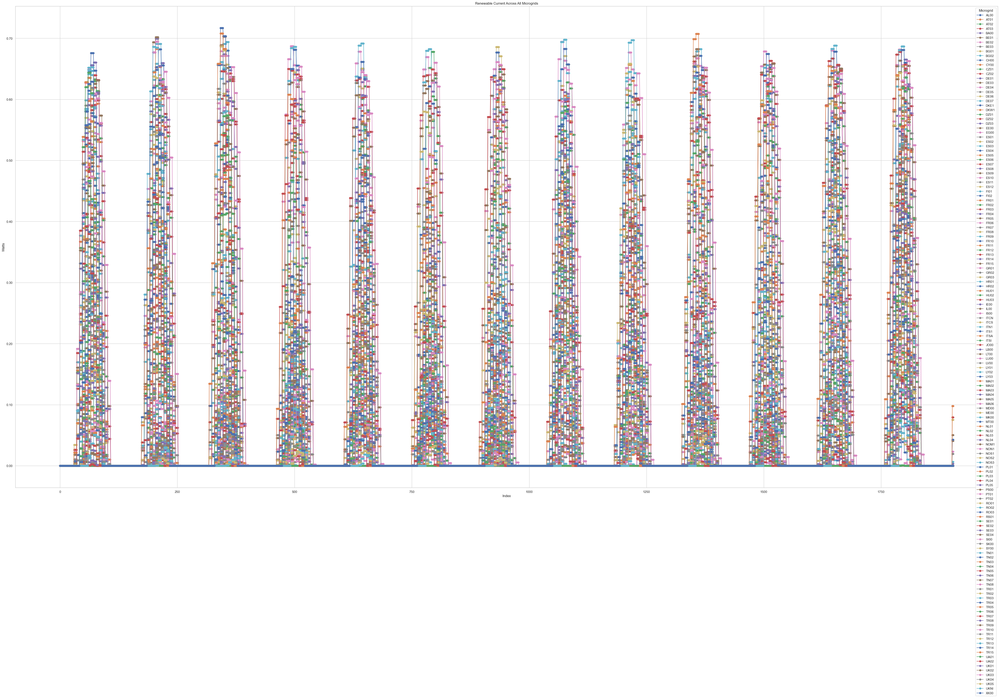

In [23]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in pv_dataframes_plugin.items():
    if 'renewable_current' not in df.columns:
        print(f"Skipping {key}: no 'renewable_current' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['renewable_current'] = pd.to_numeric(df['renewable_current'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['renewable_current'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Renewable Current Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Nodes Dataframes

In [24]:
nodes_dataframes_plugin = {}
nodes_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_scheduler[name] = df[existing_cols]

In [25]:
for key, df in nodes_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_plugin[key] = df

for key, df in nodes_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_scheduler[key] = df


nodes_dataframes_scheduler['TR10']

1,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward
0,120,-59.481963,0.0,120,-44.877580,0.0,120,-0.759295,0.0,120,-57.871521,0.0,120,-46.647117,0.0,120,-50.763622,0.0
1,120,-36.507199,0.0,120,-34.833665,0.0,120,-53.812142,0.0,120,-48.563753,0.0,120,-54.285852,0.0,120,-35.981958,0.0
2,120,-16.613206,0.0,120,-46.614458,0.0,120,-29.666297,0.0,120,-50.495262,0.0,120,-41.286534,0.0,120,-42.737372,0.0
3,120,-17.862433,0.0,120,-1.337987,0.0,120,-35.536769,0.0,120,-0.124600,0.0,120,-47.950001,0.0,120,-4.497583,0.0
4,120,-18.442951,0.0,120,-2.053270,0.0,120,-30.384277,0.0,120,-32.998274,0.0,120,-0.684689,0.0,120,-54.960032,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1900,120,-36.201735,0.0,120,-18.696656,0.0,120,-6.932515,0.0,120,-14.485960,0.0,118,-56.806669,0.0,118,-59.563824,0.0
1901,120,-14.457229,0.0,120,-19.316433,0.0,120,-13.440137,0.0,120,-18.922143,0.0,118,-3.592293,0.0,118,-45.378646,0.0
1902,120,-42.755812,0.0,120,-45.288908,0.0,120,-37.223614,0.0,120,-19.187431,0.0,118,-1.392964,0.0,118,-41.173458,0.0
1903,120,-47.693339,0.0,120,-43.374220,0.0,120,-3.767806,0.0,120,-57.311520,0.0,118,-35.099892,0.0,118,-35.715207,0.0


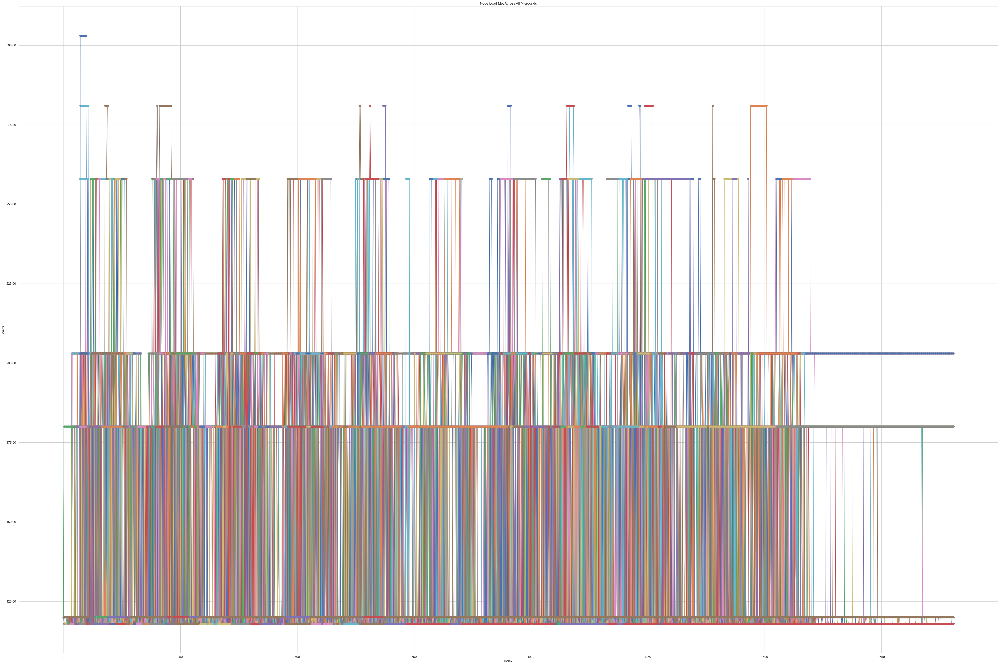

In [26]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame
for key, df in nodes_dataframes_plugin.items():
    # Find all column indices where the name is 'load_met'
    load_met_indices = [i for i, col in enumerate(df.columns) if col == 'load_met']
    
    if not load_met_indices:
        print(f"Skipping {key}: no 'load_met' columns found.")
        continue

    # Plot each 'load_met' column individually
    for idx_num, col_idx in enumerate(load_met_indices, 1):
        col_data = pd.to_numeric(df.iloc[:, col_idx], errors='coerce')
        label = f"{key} - load_met {idx_num}" if len(load_met_indices) > 1 else f"{key}"
        plt.plot(df.index, col_data, marker='o', linestyle='-', label=label)

# Customize plot
plt.title("Node Load Met Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

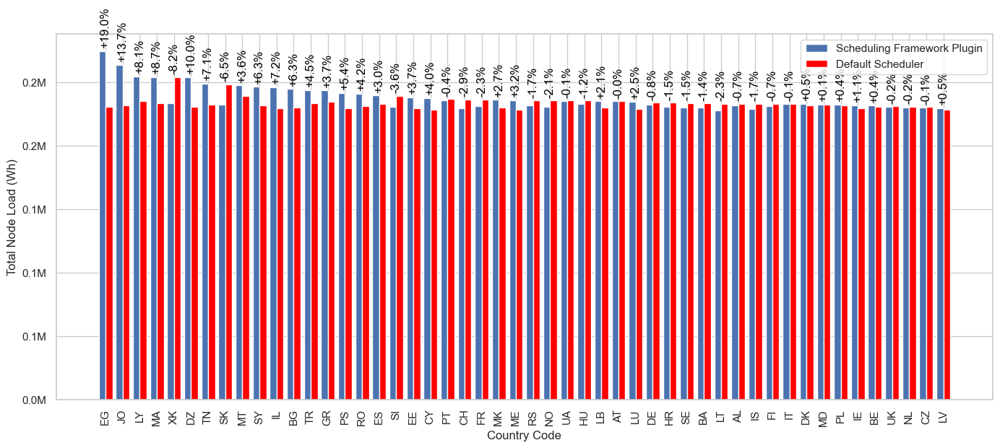

In [27]:
# --- Helper: Extract country code ---
def extract_code(key):
    match = re.match(r'^([A-Za-z]{2})', key)
    return match.group(1).upper() if match else 'Unknown'

def compute_avg_load_per_microgrid(dataframes):
    total_loads = defaultdict(float)
    counts = defaultdict(int)
    
    for key, df in dataframes.items():
        load_met_indices = [i for i, col in enumerate(df.columns) if col == 'load_met']
        if not load_met_indices:
            continue
        total_load = sum(pd.to_numeric(df.iloc[:, i], errors='coerce').sum(skipna=True) for i in load_met_indices)
        country = extract_code(key)
        total_loads[country] += total_load * 1/6
        counts[country] += 1
    
    # Calculate average load per microgrid for each country
    avg_loads = {country: (total_loads[country] / counts[country]) for country in total_loads}
    return avg_loads

# --- Step 1: Compute totals ---
plugin_totals = compute_avg_load_per_microgrid(nodes_dataframes_plugin)
scheduler_totals = compute_avg_load_per_microgrid(nodes_dataframes_scheduler)

# --- Step 2: Get all unique country codes ---
all_countries = set(plugin_totals.keys()).union(scheduler_totals.keys())

# --- Step 3: Sort by max(plugin, scheduler) per country ---
sorted_countries = sorted(
    all_countries,
    key=lambda code: max(plugin_totals.get(code, 0), scheduler_totals.get(code, 0)),
    reverse=True
)

# --- Step 4: Prepare values in sorted order ---
plugin_values = [plugin_totals.get(code, 0) for code in sorted_countries]
scheduler_values = [scheduler_totals.get(code, 0) for code in sorted_countries]
x = np.arange(len(sorted_countries))
width = 0.4

# --- Step 5: Plot ---
plt.figure(figsize=(14, 6))
plt.bar(x - width/2, plugin_values, width=width, label='Scheduling Framework Plugin')
plt.bar(x + width/2, scheduler_values, width=width, label='Default Scheduler', color='red')

plt.xticks(ticks=x, labels=sorted_countries, rotation=90, ha='center')
#plt.title("Total Node Load Met by Country Code: Plugin vs Scheduler (Sorted by Max Value)")
plt.xlabel("Country Code")
plt.ylabel("Total Node Load (Wh)")
plt.legend()

# Format y-axis in millions
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x/1_000_000:.1f}M'))

plt.tight_layout()
# Add % difference labels above each pair of bars
for i, (p, s) in enumerate(zip(plugin_values, scheduler_values)):
    # Avoid division by zero
    if s == 0:
        diff_label = "N/A"
    else:
        diff = ((p - s) / s) * 100
        diff_label = f"{diff:+.1f}%"
    
    # Position label just above the taller bar
    y = max(p, s) * 1.01
    plt.text(x[i], y, diff_label, ha='center', va='bottom', fontsize=12, color='black', rotation=90)
plt.show()

## Balancing Dataframes

In [28]:
balancing_dataframes_plugin = {}
balancing_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_scheduler[name] = df[existing_cols]

In [29]:
for key, df in balancing_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_plugin[key] = df

for key, df in balancing_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_scheduler[key] = df


balancing_dataframes_scheduler['TR10']

1,loss_load,overgeneration,reward
0,0.0,0.0,-0.0
1,0.0,0.0,-0.0
2,0.0,0.0,-0.0
3,0.0,0.0,-0.0
4,0.0,0.0,-0.0
...,...,...,...
1900,0.0,0.0,-0.0
1901,0.0,0.0,-0.0
1902,0.0,0.0,-0.0
1903,0.0,0.0,-0.0


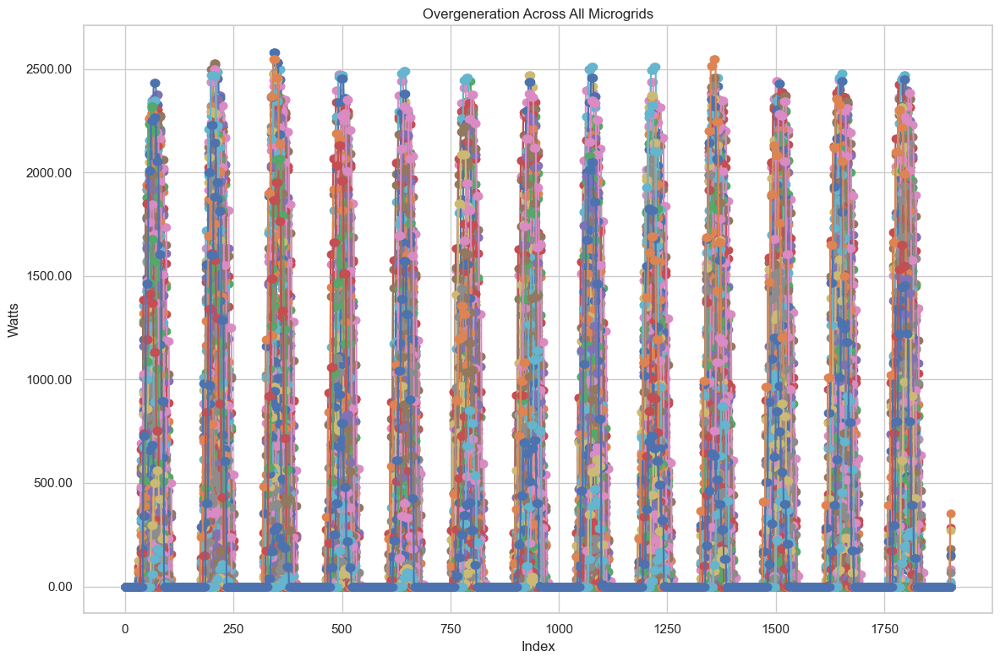

In [30]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in balancing_dataframes_plugin.items():
    if 'loss_load' not in df.columns:
        print(f"Skipping {key}: no 'loss_load' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['loss_load'] = pd.to_numeric(df['loss_load'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['loss_load'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Overgeneration Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Explore relation between PV Generation, Battery current_charge, grid import/export

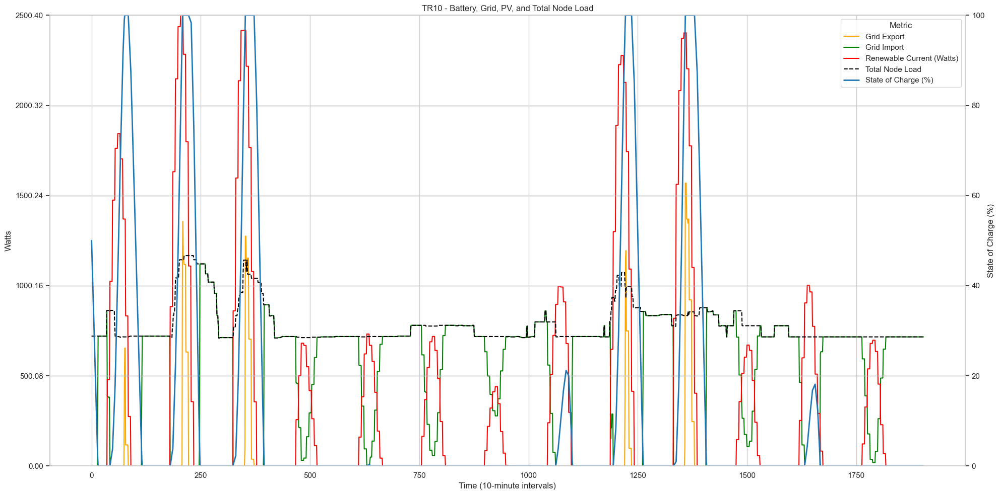

In [31]:
# Set Seaborn style
sns.set(style="whitegrid")

# Extract the relevant DataFrames
battery_df = battery_dataframes_plugin.get('TR10')
grid_df = grid_dataframes_plugin.get('TR10')
pv_df = pv_dataframes_plugin.get('TR10')
nodes_df = nodes_dataframes_plugin.get('TR10')

# Check that all exist
if battery_df is None or grid_df is None or pv_df is None or nodes_df is None:
    raise ValueError("One or more dataframes for 'TR10' are missing.")

# Convert necessary columns to numeric
battery_df['soc'] = pd.to_numeric(battery_df['soc'], errors='coerce')
battery_df['soc'] *= 100  # Scale from 0–1 to 0–100 if needed
grid_df['grid_export'] = pd.to_numeric(grid_df['grid_export'], errors='coerce')
grid_df['grid_import'] = pd.to_numeric(grid_df['grid_import'], errors='coerce')
pv_df['renewable_current'] = pd.to_numeric(pv_df['renewable_current'], errors='coerce')

# Scale renewable_current to watt-hours (assuming it's energy per second)
pv_df['renewable_current_watts'] = pv_df['renewable_current'] * 3600

# Sum all 'load_met' columns from nodes_df (handling duplicates)
load_met_indices = [i for i, col in enumerate(nodes_df.columns) if col == 'load_met']
if not load_met_indices:
    print("No 'load_met' columns found in nodes_df for TR10.")
    total_load_met = None
else:
    # Sum all matching columns across the rows
    load_met_df = nodes_df.iloc[:, load_met_indices].apply(pd.to_numeric, errors='coerce')
    total_load_met = load_met_df.sum(axis=1)

# --- Compute min/max for primary y-axis (Watts) ---
watts_series = [
    grid_df['grid_export'],
    grid_df['grid_import'],
    pv_df['renewable_current_watts']
]
if total_load_met is not None:
    watts_series.append(total_load_met)

watts_min = min(s.min() for s in watts_series)
watts_max = max(s.max() for s in watts_series)
watts_range = watts_max - watts_min

# Create the base figure and primary y-axis
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot data on the primary y-axis (Watts)
ax1.plot(grid_df.index, grid_df['grid_export'], label='Grid Export', color='orange')
ax1.plot(grid_df.index, grid_df['grid_import'], label='Grid Import', color='green')
ax1.plot(pv_df.index, pv_df['renewable_current_watts'], label='Renewable Current (Watts)', color='red')
if total_load_met is not None:
    ax1.plot(nodes_df.index, total_load_met, label='Total Node Load', linestyle='--', color='black')

# Customize primary y-axis (Watts)
ax1.set_xlabel("Time (10-minute intervals)")
ax1.set_ylabel("Watts")
ax1.set_ylim(watts_min, watts_max)
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# Create secondary y-axis for State of Charge (%)
ax2 = ax1.twinx()
ax2.plot(battery_df.index, battery_df['soc'], label='State of Charge (%)', linewidth=2, color='tab:blue')

# Align the visual height by setting the same axis position scale
# We fix the secondary axis to always go from 0% to 100%
ax2.set_ylabel("State of Charge (%)")
ax2.set_ylim(0, 100)

# Match the number of ticks between axes
ax2.set_yticks(np.linspace(0, 100, num=6))
ax1.set_yticks(np.linspace(watts_min, watts_max, num=6))

# Combine legends from both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, title="Metric", loc='upper right')

# Final plot settings
plt.title("TR10 - Battery, Grid, PV, and Total Node Load")
ax1.grid(True)
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.tight_layout()
plt.show()

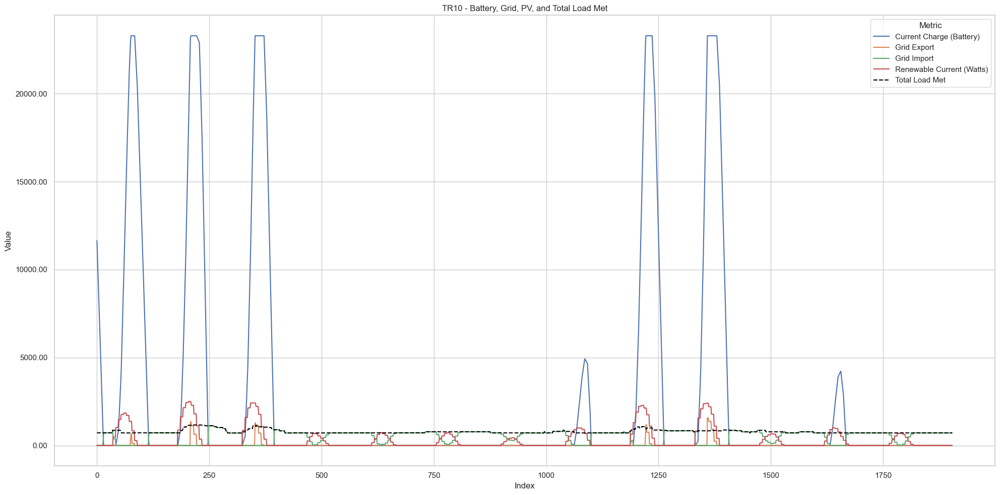

In [32]:
# Set Seaborn style
sns.set(style="whitegrid")

# Extract the relevant DataFrames
battery_df = battery_dataframes_plugin.get('TR10')
grid_df = grid_dataframes_plugin.get('TR10')
pv_df = pv_dataframes_plugin.get('TR10')
nodes_df = nodes_dataframes_plugin.get('TR10')

# Check that all exist
if battery_df is None or grid_df is None or pv_df is None or nodes_df is None:
    raise ValueError("One or more dataframes for 'TR10' are missing.")

# Convert necessary columns to numeric
battery_df['current_charge'] = pd.to_numeric(battery_df['current_charge'], errors='coerce')
grid_df['grid_export'] = pd.to_numeric(grid_df['grid_export'], errors='coerce')
grid_df['grid_import'] = pd.to_numeric(grid_df['grid_import'], errors='coerce')
pv_df['renewable_current'] = pd.to_numeric(pv_df['renewable_current'], errors='coerce')

# Scale renewable_current to watt-hours (assuming it's energy per second)
pv_df['renewable_current_watts'] = pv_df['renewable_current'] * 3600

# Sum all 'load_met' columns from nodes_df (handling duplicates)
load_met_indices = [i for i, col in enumerate(nodes_df.columns) if col == 'load_met']
if not load_met_indices:
    print("No 'load_met' columns found in nodes_df for TR10.")
    total_load_met = None
else:
    # Sum all matching columns across the rows
    load_met_df = nodes_df.iloc[:, load_met_indices].apply(pd.to_numeric, errors='coerce')
    total_load_met = load_met_df.sum(axis=1)

# Create the plot
plt.figure(figsize=(20, 10))

# Plot each series from its respective DataFrame
plt.plot(battery_df.index, battery_df['current_charge'], label='Current Charge (Battery)')
plt.plot(grid_df.index, grid_df['grid_export'], label='Grid Export')
plt.plot(grid_df.index, grid_df['grid_import'], label='Grid Import')
plt.plot(pv_df.index, pv_df['renewable_current_watts'], label='Renewable Current (Watts)')

# Plot summed load_met if available
if total_load_met is not None:
    plt.plot(nodes_df.index, total_load_met, label='Total Load Met', linestyle='--', color='black')

# Customize the plot
plt.title("TR10 - Battery, Grid, PV, and Total Load Met")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend(title="Metric")
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Checking if grid import/export is active

In [33]:
test_df.columns

battery_test = test_df[battery_cols]
grid_test = test_df[grid_cols]
pv_test = test_df[pv_cols]

battery_test = battery_test.drop([0, 1])
battery_test # battery.1 = current_charge

grid_test = grid_test.drop([0, 1])
grid_test # grid.3 export, grid.4 import

pv_test = pv_test.drop([0, 1])
pv_test # pv_source.1 renewable_current

battery_test = battery_test.apply(pd.to_numeric, errors='coerce')
grid_test = grid_test.apply(pd.to_numeric, errors='coerce')
pv_test = pv_test.apply(pd.to_numeric, errors='coerce')



## Azure Worktrace

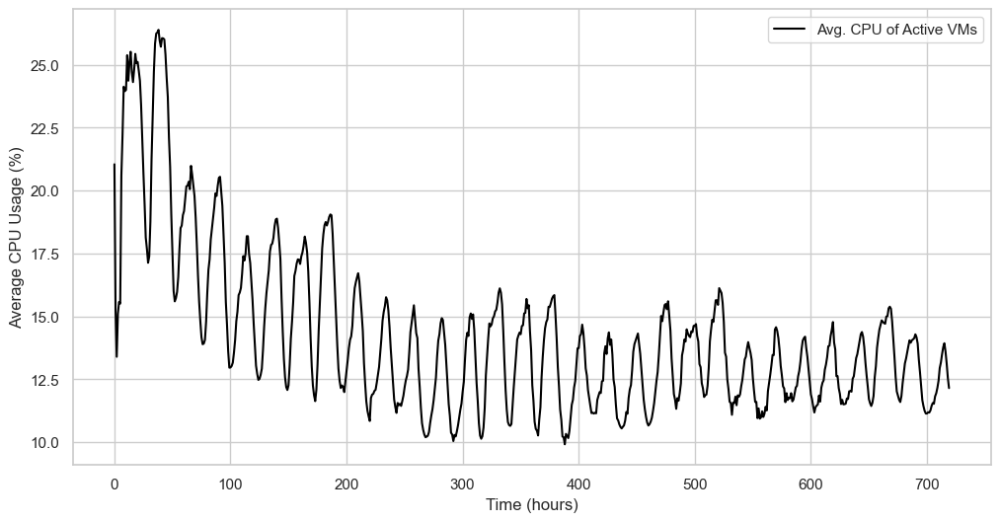

In [34]:
azure = pd.read_csv('../data/vmtable2.csv')
# Parse columns
azure.iloc[:, 0] = pd.to_numeric(azure.iloc[:, 0])  # vm_created (seconds)
azure.iloc[:, 1] = pd.to_numeric(azure.iloc[:, 1])  # vm_deleted (seconds)
azure.iloc[:, 3] = pd.to_numeric(azure.iloc[:, 3])  # avg_cpu

vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values
avg_cpu = azure.iloc[:, 3].values

# Set up a timeline grid (e.g. every hour)
time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

avg_cpu_over_time = []

# For each time point, calculate avg CPU of running VMs
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    running_cpus = avg_cpu[running_mask]
    
    if len(running_cpus) > 0:
        avg_cpu_over_time.append(running_cpus.mean())
    else:
        avg_cpu_over_time.append(np.nan)

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Plot
plt.figure(figsize=(12, 6))
plt.plot(time_hours, avg_cpu_over_time, label='Avg. CPU of Active VMs', color='black')
plt.xlabel('Time (hours)')
plt.ylabel('Average CPU Usage (%)')
plt.grid(True)
plt.legend()
plt.show()

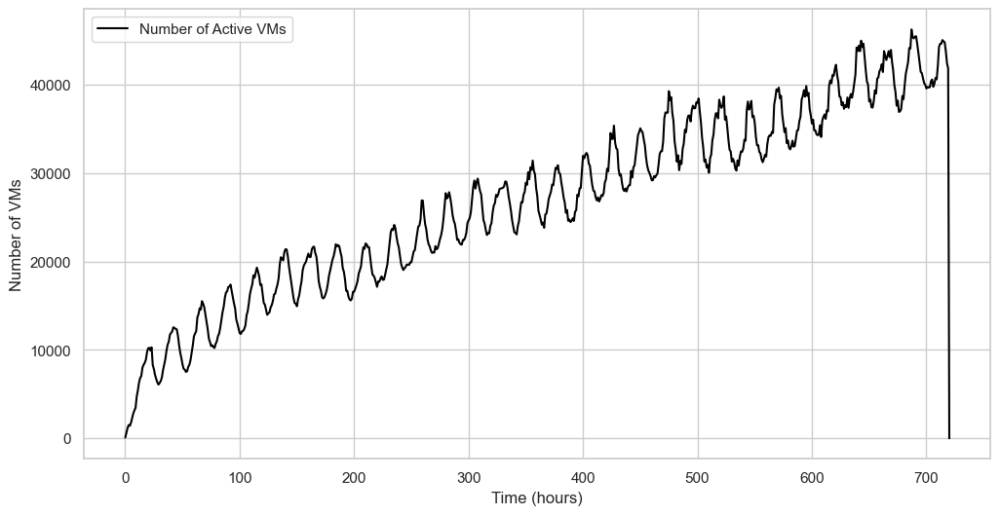

In [35]:
# Assuming azure dataframe is already loaded and columns parsed
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

active_vm_counts = []
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    active_vm_counts.append(np.sum(running_mask))

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Create a DataFrame for seaborn
plot_df = pd.DataFrame({
    'Time (hours)': time_hours,
    'Active VMs': active_vm_counts
})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(data=plot_df, x='Time (hours)', y='Active VMs', color='black', label='Number of Active VMs')
plt.xlabel('Time (hours)')
plt.ylabel('Number of VMs')
plt.grid(True)
plt.legend()
plt.show()

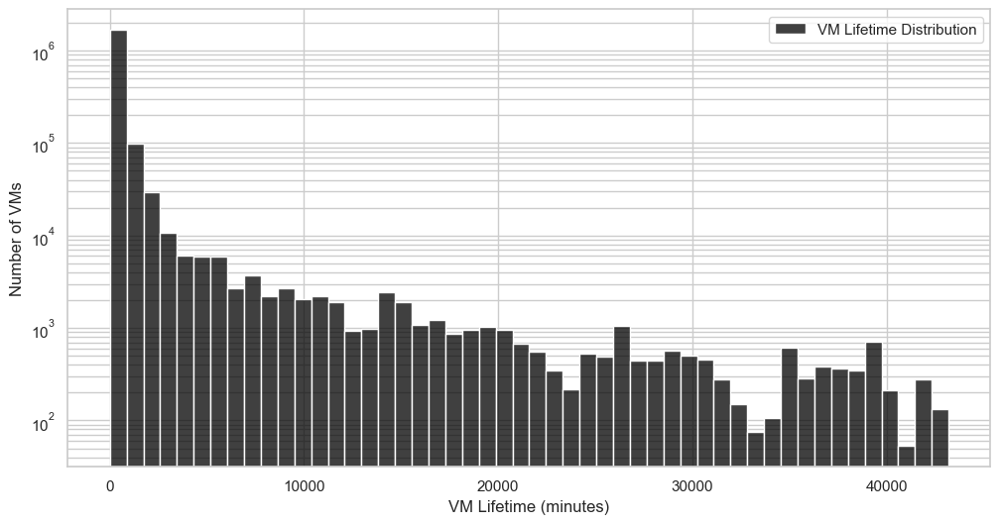

In [36]:
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

# Calculate VM lifetime in minutes
vm_lifetimes_minutes = (vm_deleted - vm_created) / 60  # convert seconds to minutes

# Prepare DataFrame for seaborn
plot_df = pd.DataFrame({'VM Lifetime (minutes)': vm_lifetimes_minutes})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.histplot(
    data=plot_df,
    x='VM Lifetime (minutes)',
    bins=50,
    color='black',
    kde=False,
    label='VM Lifetime Distribution'
)
plt.xlabel('VM Lifetime (minutes)')
plt.ylabel('Number of VMs')
#plt.title('Distribution of VM Lifetimes (log scale)')
plt.yscale('log')  # Log scale on y-axis
plt.grid(True, which='both', axis='y')
plt.legend()  # Show legend
plt.show()

## Aggregate of export per grids

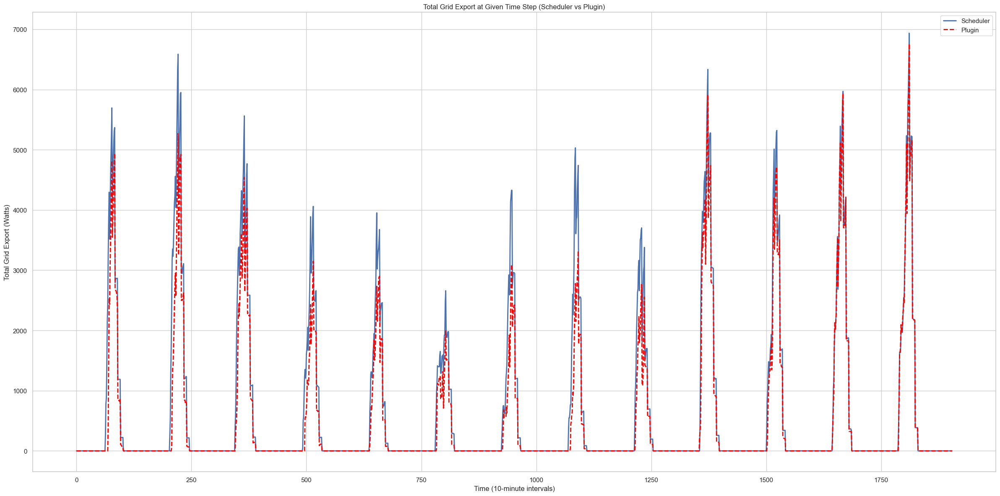

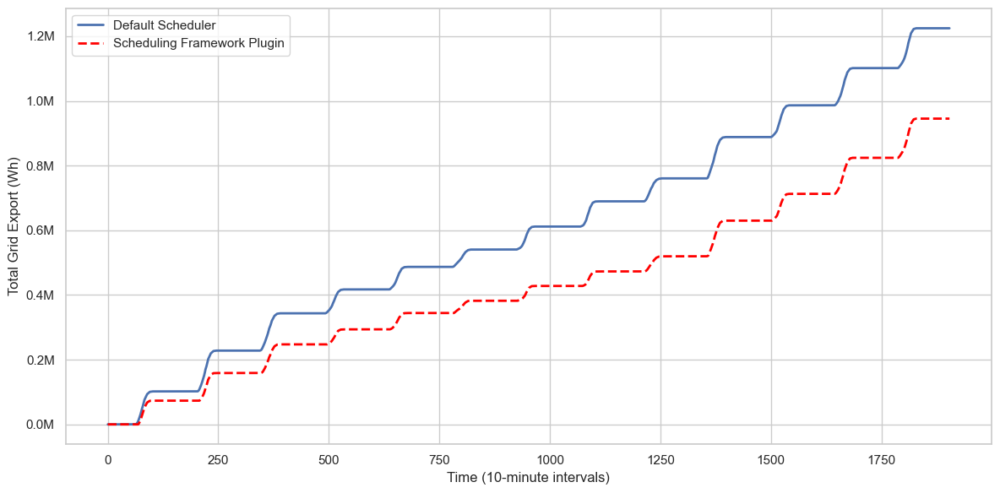

Total Export - Plugin:     945,279 Wh
Total Export - Scheduler: 1,224,689 Wh
Total Difference:                 -279,410 Wh
Percentage Difference:               -22.81%


In [37]:
def compute_total_export_over_rows(dataframes_dict):
    aligned_exports = []

    for key, df in dataframes_dict.items():
        if 'grid_export' not in df.columns:
            print(f"Skipping {key}: no 'grid_export' column found.")
            continue

        # Ensure numeric
        df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

        # Reset index to align rows
        aligned_exports.append(df['grid_export'].reset_index(drop=True) * 1/6)

    # Combine and sum across microgrids
    combined_exports = pd.concat(aligned_exports, axis=1).fillna(0)
    return combined_exports.sum(axis=1)

# Compute total exports row-by-row
total_export_scheduler = compute_total_export_over_rows(grid_dataframes_scheduler)
total_export_plugin = compute_total_export_over_rows(grid_dataframes_plugin)

# --- Figure 1: Original total export plot ---
plt.figure(figsize=(24, 12))
plt.plot(total_export_scheduler, label='Scheduler', linewidth=2)
plt.plot(total_export_plugin, label='Plugin', color='red', linewidth=2, linestyle='--')
plt.title("Total Grid Export at Given Time Step (Scheduler vs Plugin)")
plt.xlabel("Time (10-minute intervals)")
plt.ylabel("Total Grid Export (Watts)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Compute cumulative total export (sum up to and including each row)
cumulative_export_scheduler = total_export_scheduler.cumsum()
cumulative_export_plugin = total_export_plugin.cumsum()

# --- Figure: Cumulative Total Grid Export ---
plt.figure(figsize=(12, 6))
plt.plot(cumulative_export_scheduler, label='Default Scheduler', linewidth=2)  # Default color
plt.plot(cumulative_export_plugin, label='Scheduling Framework Plugin', color='red', linewidth=2, linestyle='--')
#plt.title("Cumulative Total Grid Export (Scheduler vs Plugin)")
plt.xlabel("Time (10-minute intervals)")
plt.ylabel("Total Grid Export (Wh)")

# Format y-axis as millions
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x*1e-6:.1f}M'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Final cumulative export values
final_plugin_export = cumulative_export_plugin.iloc[-1]
final_scheduler_export = cumulative_export_scheduler.iloc[-1]

# Compute absolute and percentage differences
absolute_diff = final_plugin_export - final_scheduler_export
if final_scheduler_export != 0:
    percent_diff = (absolute_diff / final_scheduler_export) * 100
else:
    percent_diff = float('inf')  # Handle divide-by-zero if needed

# Print both differences
print(f"Total Export - Plugin:     {final_plugin_export:,.0f} Wh")
print(f"Total Export - Scheduler: {final_scheduler_export:,.0f} Wh")
print(f"Total Difference:                 {absolute_diff:,.0f} Wh")
print(f"Percentage Difference:               {percent_diff:+.2f}%")

## Aggregate of Node Load and Renewable Generation per Country Code

Plugin renewables per country:
AL: 0.05552479617987661
AT: 0.05294576981915324
BA: 0.0636584727177312
BE: 0.035823968427878494
BG: 0.09388070375670823
CH: 0.033288109334069185
CY: 0.09542943451324366
CZ: 0.03970844366082618
DE: 0.03291080121465956
DK: 0.022236119322342117
DZ: 0.159433667967638
EE: 0.025217507470920487
EG: 0.17954752832715837
ES: 0.06969615675381219
FI: 0.006697982907758387
FR: 0.046195866163578854
GR: 0.08769026390341322
HR: 0.0495979618715995
HU: 0.05174537825062162
IE: 0.04205924400727666
IL: 0.1419975446211733
IS: 0.0021374886753055093
IT: 0.07071277563303471
JO: 0.15293174923908107
LB: 0.08780119793563289
LT: 0.039629176094888675
LU: 0.025520807372078146
LV: 0.033014080861275746
LY: 0.17460686831369684
MA: 0.14400067525447144
MD: 0.06634720928904654
ME: 0.049397516513605154
MK: 0.08498666816806041
MT: 0.11712980212028035
NL: 0.030494009783409215
NO: 0.011349147600497305
PL: 0.0508861289214134
PS: 0.12011396212450047
PT: 0.05314397510276599
RO: 0.07075465380734307
R

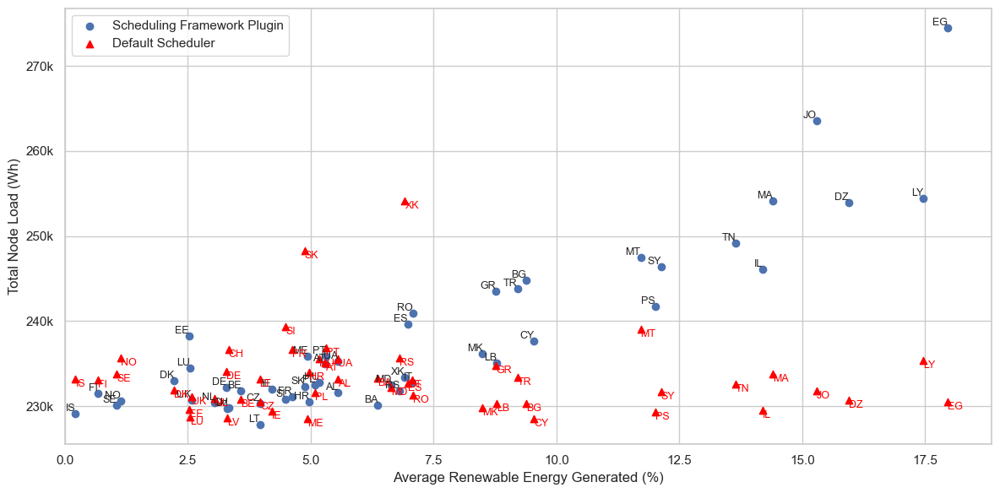

✅ Plugin and Scheduler renewable values are identical for all countries.


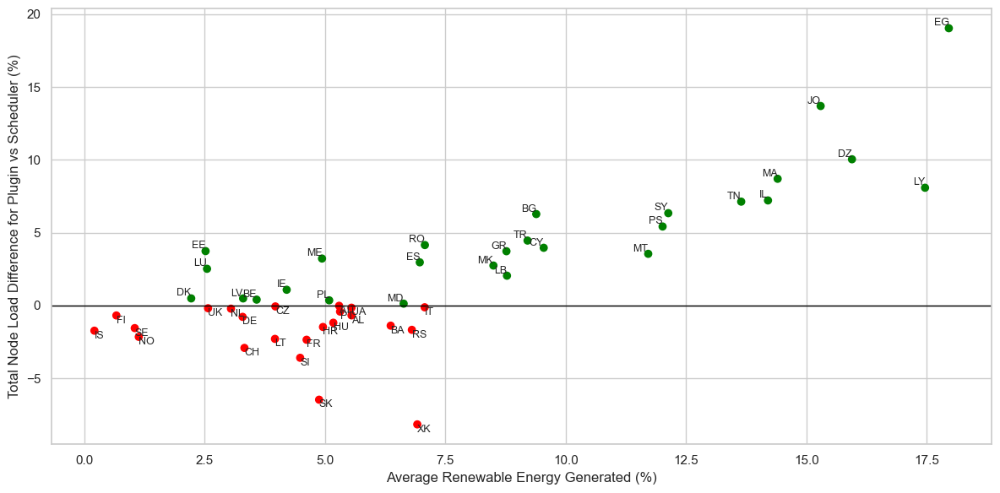


🔹 Positive Load Difference Range: 0.13% to 19.04%
🔸 Negative Load Difference Range: -8.16% to -0.02%


In [38]:
def compute_avg_renewable_per_microgrid(dataframes):
    renewable_values = defaultdict(list)
    
    for key, df in dataframes.items():
        if 'renewable_current' not in df.columns:
            continue
        renewable = pd.to_numeric(df['renewable_current'], errors='coerce').mean(skipna=True)
        country = extract_code(key)
        renewable_values[country].append(renewable)
    
    avg_renewables = {country: np.nanmean(vals) for country, vals in renewable_values.items()}
    return avg_renewables

# --- Step 1: Load data ---
plugin_loads = compute_avg_load_per_microgrid(nodes_dataframes_plugin)
scheduler_loads = compute_avg_load_per_microgrid(nodes_dataframes_scheduler)

plugin_renewables = compute_avg_renewable_per_microgrid(pv_dataframes_plugin)
scheduler_renewables = compute_avg_renewable_per_microgrid(pv_dataframes_scheduler)

# --- Step 2: Common countries for comparison ---
all_countries = set(plugin_loads.keys()).union(scheduler_loads.keys())

# --- Step 3: Build data for plotting ---
plugin_x, plugin_y, plugin_labels = [], [], []
scheduler_x, scheduler_y, scheduler_labels = [], [], []

for country in all_countries:
    plugin_renew = plugin_renewables.get(country, np.nan)
    if country in plugin_loads and not np.isnan(plugin_renew):
        plugin_x.append(plugin_renew * 100)  # multiply by 100 here
        plugin_y.append(plugin_loads[country])
        plugin_labels.append(country)

    scheduler_renew = scheduler_renewables.get(country, np.nan)
    if country in scheduler_loads and not np.isnan(scheduler_renew):
        scheduler_x.append(scheduler_renew * 100)  # multiply by 100 here
        scheduler_y.append(scheduler_loads[country])
        scheduler_labels.append(country)

print("Plugin renewables per country:")
for c, val in plugin_renewables.items():
    print(f"{c}: {val}")

print("\nScheduler renewables per country:")
for c, val in scheduler_renewables.items():
    print(f"{c}: {val}")

# --- Step 4: Plot scatter ---
plt.figure(figsize=(12, 6))
plt.scatter(plugin_x, plugin_y, label='Scheduling Framework Plugin', marker='o')
plt.scatter(scheduler_x, scheduler_y, label='Default Scheduler', color='red', marker='^')

# Annotate points with country codes
for x, y, label in zip(plugin_x, plugin_y, plugin_labels):
    plt.text(x, y, label, fontsize=9, ha='right', va='bottom')
for x, y, label in zip(scheduler_x, scheduler_y, scheduler_labels):
    plt.text(x, y, label, fontsize=9, ha='left', va='top', color='red')

# Calculate max x for axis limit (add a small margin)
max_x = max(plugin_x + scheduler_x) if (plugin_x + scheduler_x) else 100
x_limit = min(100, max_x * 1.05)  # don't exceed 100%

# Axis settings
plt.xlabel("Average Renewable Energy Generated (%)")
plt.ylabel("Total Node Load (Wh)")
plt.xlim(0, x_limit)
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x/1_000:.0f}k'))
plt.legend()
#plt.title("Total Node Load Met vs Renewable Energy (%): Plugin vs Scheduler")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Compute percent difference in load met ---
diff_x, diff_y, diff_labels = [], [], []

for country in all_countries:
    plugin_renew = plugin_renewables.get(country, np.nan)
    plugin_load = plugin_loads.get(country, np.nan)
    scheduler_load = scheduler_loads.get(country, np.nan)

    if (
        not np.isnan(plugin_renew) and
        not np.isnan(plugin_load) and
        not np.isnan(scheduler_load) and
        scheduler_load != 0
    ):
        percent_diff = ((plugin_load - scheduler_load) / scheduler_load) * 100
        diff_x.append(plugin_renew * 100)  # Use Plugin renewable %
        diff_y.append(percent_diff)
        diff_labels.append(country)

differences = []

for country in all_countries:
    plugin_val = plugin_renewables.get(country)
    scheduler_val = scheduler_renewables.get(country)

    # Check for mismatch (handle NaNs safely)
    if not np.isclose(plugin_val, scheduler_val, equal_nan=True):
        differences.append((country, plugin_val, scheduler_val))

if not differences:
    print("✅ Plugin and Scheduler renewable values are identical for all countries.")
else:
    print("⚠️ Differences found:")
    for country, p_val, s_val in differences:
        print(f"{country}: Plugin = {p_val}, Scheduler = {s_val}")

# --- Plot figure ---
plt.figure(figsize=(12, 6))
scatter = plt.scatter(diff_x, diff_y, c=['green' if y >= 0 else 'red' for y in diff_y], marker='o')

# Annotate points
for x, y, label in zip(diff_x, diff_y, diff_labels):
    ha = 'right' if y >= 0 else 'left'
    va = 'bottom' if y >= 0 else 'top'
    plt.text(x, y, label, fontsize=9, ha=ha, va=va)

# Axis settings
plt.axhline(0, color='black', linewidth=1)
plt.xlabel("Average Renewable Energy Generated (%)")
#plt.ylabel("Percent Difference in Load Met (Plugin vs Scheduler)")
#plt.ylabel("Difference in Node Load Met for Plugin vs Scheduler (%)")
plt.ylabel("Total Node Load Difference for Plugin vs Scheduler (%)")
plt.grid(True)
plt.tight_layout()
#plt.title("Impact of Renewable Penetration on Load Met (% Difference)")
plt.show()

# --- Compute refined positive and negative ranges ---
positive_diffs = [y for y in diff_y if y > 0]
negative_diffs = [y for y in diff_y if y < 0]

if positive_diffs:
    min_pos = min(positive_diffs)
    max_pos = max(positive_diffs)
    print(f"\n🔹 Positive Load Difference Range: {min_pos:.2f}% to {max_pos:.2f}%")
else:
    print("\n🔹 No positive load differences found.")

if negative_diffs:
    max_neg = max(negative_diffs)  # closest to 0
    min_neg = min(negative_diffs)  # most negative
    print(f"🔸 Negative Load Difference Range: {min_neg:.2f}% to {max_neg:.2f}%")
else:
    print("🔸 No negative load differences found.")

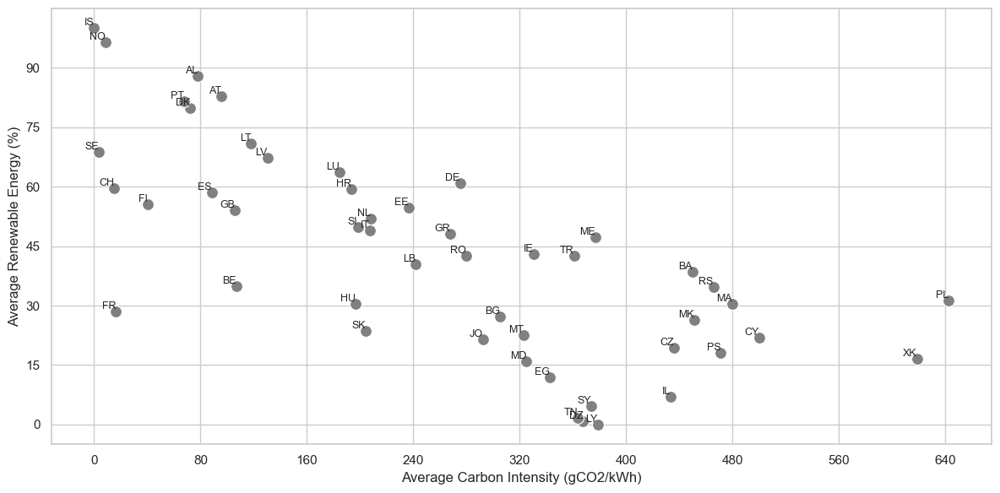

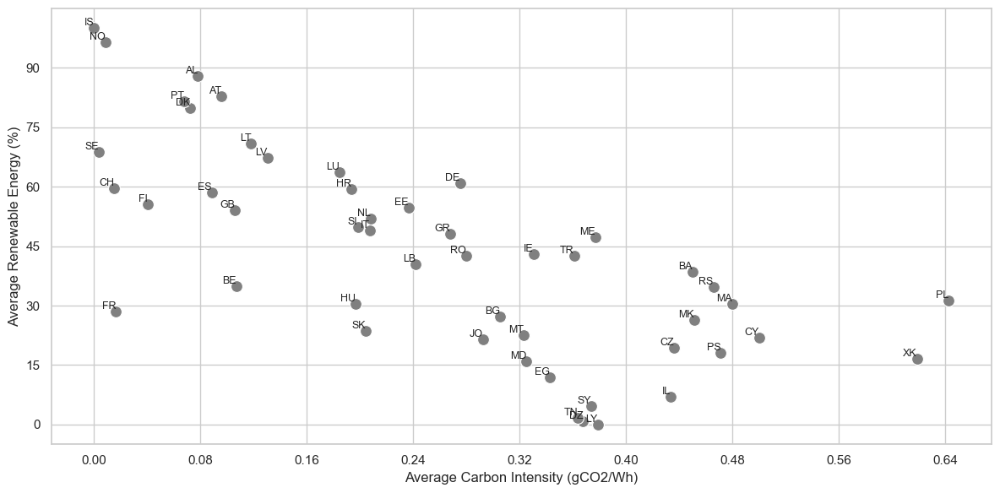

In [39]:
carbon = pd.read_csv(CARBON_PATH)

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Create the scatterplot
ax = sns.scatterplot(
    data=carbon,
    x='Average Carbon Intensity',
    y='Average RE%',
    s=100,  # size of the dots
    color='grey'
)

# Annotate each point with the Zone ID
for i, row in carbon.iterrows():
    ax.text(
        row['Average Carbon Intensity'],
        row['Average RE%'],
        str(row['Zone ID']),
        fontsize=9,
        ha='right',
        va='bottom'
    )

# Formatting axes
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
#ax.set_title('Zone RE% vs Carbon Intensity')
plt.xlabel('Average Carbon Intensity (gCO2/kWh)')
plt.ylabel('Average Renewable Energy (%)')
plt.tight_layout()
plt.show()

# Convert 'Average Carbon Intensity' from gCO2/kWh to gCO2/Wh
carbon['Average Carbon Intensity (gCO2/Wh)'] = carbon['Average Carbon Intensity'] / 1000

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Create the scatterplot with the new unit
ax = sns.scatterplot(
    data=carbon,
    x='Average Carbon Intensity (gCO2/Wh)',
    y='Average RE%',
    s=100,  # size of the dots
    color='grey'
)

# Annotate each point with the Zone ID
for i, row in carbon.iterrows():
    ax.text(
        row['Average Carbon Intensity (gCO2/Wh)'],
        row['Average RE%'],
        str(row['Zone ID']),
        fontsize=9,
        ha='right',
        va='bottom'
    )

# Formatting axes
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Average Carbon Intensity (gCO2/Wh)')  # Update the x-axis label
plt.ylabel('Average Renewable Energy (%)')
plt.tight_layout()
plt.show()